# Feature Detection Tutorial

Feature detection is the process of scanning computer images to extract bits of identifiable pieces of information. There is no exact universal definition on what constitutes a feature but we can define certain type of features such as edges, corners and blobs (ROI).

### Loading Images

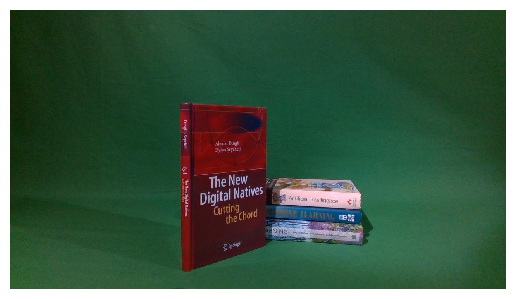

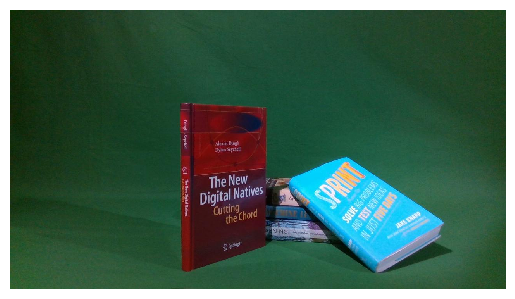

In [1]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

#Loading Images
images = {}
for x in os.listdir("images"):
    images[x] = cv2.imread("images/" + x)
    images[x]= images[x][:,:,::-1]
    plt.imshow(images[x], interpolation='nearest')
    plt.axis("off")
    plt.show() 

In [2]:
# Retrieving cv2 version
cv2.__version__

'4.7.0'

### Function which prints a list of image

In [3]:
#Function takes parameters number of rows and columns
def PrintImages(images, rows, cols):
    #Creating a Grid, depending on the number of rows and columns
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 10*round(rows/2))) 
    #Flattening the axes and taking the number of unwanted plots
    axes = axes.flatten()
    unwantedPlots=len(images)
    #Looping through all the images
    for i, (imageName, image) in enumerate(images.items()):
        #Checking whether exceeded list and setting the number of unwantedPlots starting value
        if i >= rows * cols:
            unwantedPlots=i
            break
        
        #Calculating row and column
        row = i // cols 
        col = i % cols
        
        #Error checking for axes keys
        if row < rows and col < cols:
            axes[i].imshow(image, interpolation='nearest', cmap='gray') #Displaying the image
            axes[i].set_title(imageName) #Setting the title
            axes[i].axis('off') #Removing the axes
    
    #Deleting the extra plots
    for i in range(unwantedPlots, len(axes)):
        fig.delaxes(axes[i])
    #Showing plot
    plt.show()

<b style="font-size:18px;">Exercise 1.0 - Corner Harris</b>

Using opencv research how to use cv2.cornerHarris() function. 

Download the <a href="https://github.com/dylanseychell/COTSDataset/blob/master/Part%202%20-%20Multiple%20Objects/academic_book_oc/3_colour.jpeg"> colour_3.jpeg</a> from the academic_book_oc found in the COTS dataset. Apply the corner Harris function to extract features from the image. 


Certain algorithms that we covered today’s tutorial might be covered by a license which will not allow you to use to algorithm. As we are using this for research you might need to download opencv-contrib

<i style="color:red">
You need opencv-contrib installed
Uninstall all previous opencv versions

pip install opencv-python==3.4.2.17 <br>
pip install opencv-contrib-python==3.4.2.17
    </i>
    
<a href="https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html
">link</a>






In [4]:
def CornerHarris(image,threshold):
    #Converting Image to grayScale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    #Calling the Corner Harris detection on the grayScale Image
    dst = cv2.cornerHarris(gray,2,3,0.04)
    #Dilating the result obtrained
    dst = cv2.dilate(dst,None)
    #Thresholding for Optimal Value
    image[dst>threshold*dst.max()]=[0,0,255]
    return image

In [5]:
#Retrieving image
image = images["3_colour.jpeg"].copy()
#Calculating the Corner Harris with different Thresholds
cornerHarris={}
for value in [0.01,0.1,0.5,1]:
    image = images["3_colour.jpeg"].copy()
    cornerHarris["3_colour.jpeg Corner Harris Threshold= "+str(value)]=CornerHarris(image,value)

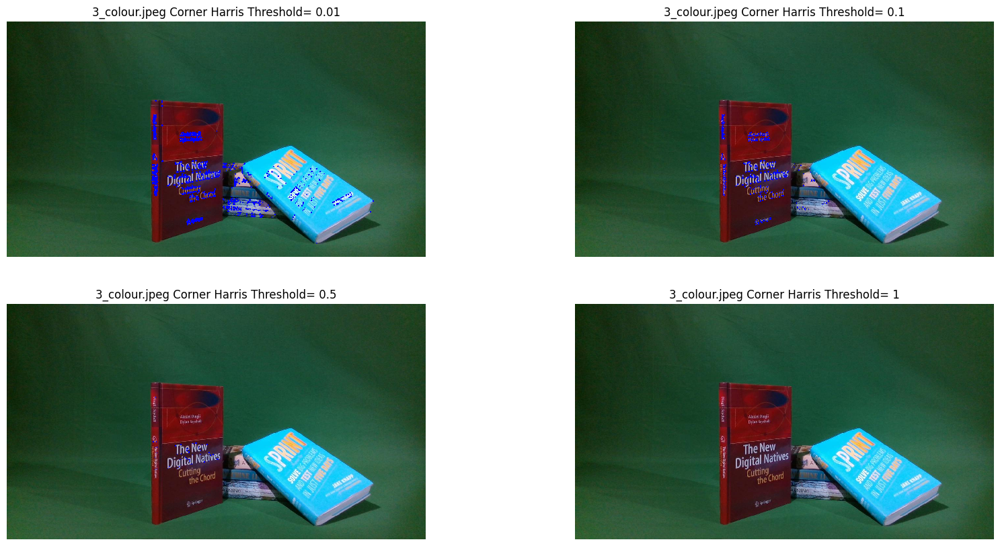

In [6]:
#Displaying Image
PrintImages(cornerHarris,2,2)

**Observations:** </br>
The aforementioned images with various thresholds were produced using the CornerHarris function. It was discovered that a threshold value of 0.1 generated the best corner detection results, but a larger threshold, such as 1, produced no corner detection results. A lower criterion of 0.01 however, discovered a large number of corners, the most of which were false positives. We may thus draw the conclusion that the threshold used has a significant impact on the accuracy of the CornerHarris function's corner detection findings. The threshold would need to be changed for each image in order to produce the desired results, which is a significant downside.

<b style="font-size:18px;">Exercise 1.1 - Shi-Tomasi Corner Detector</b>

Using opencv research how to use cv2.goodFeaturesToTrack() function.  
Download the <a href="https://github.com/dylanseychell/COTSDataset/blob/master/Part%202%20-%20Multiple%20Objects/academic_book_oc/3_colour.jpeg"> colour_3.jpeg</a> from the academic_book_oc found in the COTS dataset. Apply the Shi-Tomasi Corner Detector to extract features from the image. 
<a href="https://docs.opencv.org/3.4/d4/d8c/tutorial_py_shi_tomasi.html
">link</a>


In [7]:
def ShiTomasiCornerDetection(image,noOfCorners):
    #Converting image to grayScale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    #Detecting the Corners through the Shi-Tomasi Corner Harris detection on the grayScale Image
    corners = cv2.goodFeaturesToTrack(gray,noOfCorners,0.01,10)
    corners = np.int0(corners)
    #Creating a circle on the image at the corner position
    for i in corners:
        x,y = i.ravel()
        cv2.circle(image,(x,y),3,(0,0,255),-1)
    return image

In [8]:
#Retrieving image
image = images["3_colour.jpeg"].copy()
shiTomasi={}
#Calculating the Shi-Tomasi Corner Detection with different number of corners
for value in [25,150,250,None]:
    image = images["3_colour.jpeg"].copy()
    shiTomasi["3_colour.jpeg Shi-Tomasi No Of Corners ="+str(value)]=ShiTomasiCornerDetection(image,value)

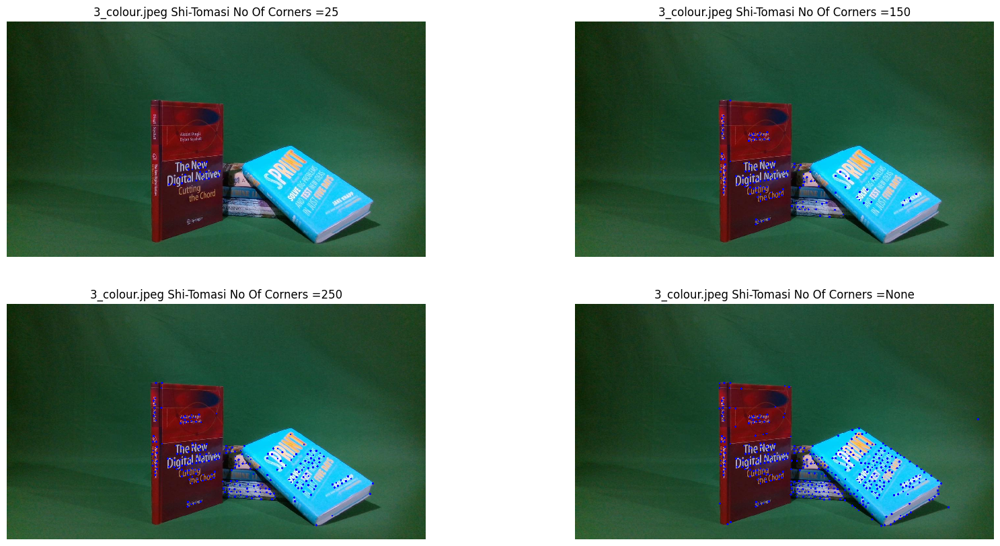

In [9]:
#Displaying Image
PrintImages(shiTomasi,2,2)

**Observations:** </br>
The aforementioned images with various thresholds were produced using the ShiTomasiCornerDetection function. It was discovered that a corner count of 250 generated the best corner detection results, but a larger corner count, such as None, discovered a large number of corners, the most of which were false positives. On the other hand, a smaller corner count value than 250 failed to detect all the corners. We may thus draw the conclusion that the corner count value used has a significant impact on the accuracy of the ShiTomasiCornerDetection function's corner detection findings. The corner count would need to be changed for each image in order to produce the desired results, which is a significant downside. Additionally, when comparing the above corner detected images, it was noted that Shi-Tomasi performed better than Corner Harris in this particular case as Shi-Tomasi visualises corners better.

<b style="font-size:18px;">Exercise 1.2 - SIFT</b>

Using opencv research how to use cv2.xfeatures2d.SIFT_create() function.  
Download the <a href="https://github.com/dylanseychell/COTSDataset/blob/master/Part%202%20-%20Multiple%20Objects/academic_book_oc/3_colour.jpeg"> colour_3.jpeg</a> from the academic_book_oc found in the COTS dataset. Apply the SIFT function to extract features from the image. 

<i style="color:red">
You need opencv-contrib installed
Uninstall all previous opencv versions

pip install opencv-python==3.4.2.17 <br>
pip install opencv-contrib-python==3.4.2.17
    </i>
    
<a href="https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html
">link
</a>


In [10]:
def SIFT(image,numberOfCorners):
    #Converting image to grayScale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    #Initiating SIFT Detector, and retrieving the key points
    sift = cv2.SIFT_create(numberOfCorners)
    kp = sift.detect(gray,None)
    #Drawing key points
    image=cv2.drawKeypoints(image,kp,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return image

In [11]:
#Retrieving image
image = images["3_colour.jpeg"].copy()
sift={}
#Calculating the SIFT Detection with different number of corners
for value in [10,1000,3000,None]:
    image = images["3_colour.jpeg"].copy()
    sift["3_colour.jpeg SIFT No Of Circles ="+str(value)]=SIFT(image,value)

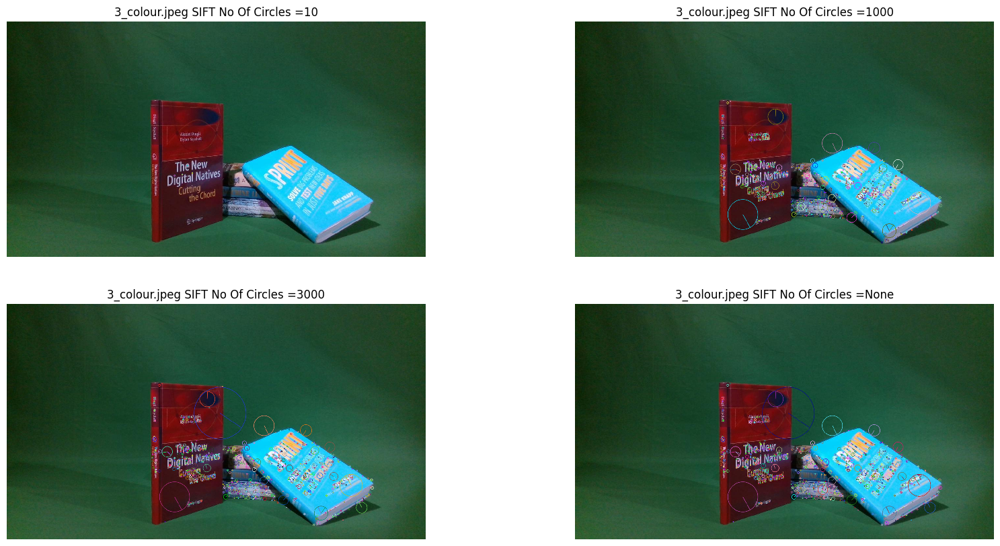

In [12]:
#Displaying Image
PrintImages(sift,2,2)

**Observations:** </br>
The aforementioned images with various corner count values were produced using the SIFT function. It was discovered that a corner count of 1000 generated the best corner detection results, but a larger corner count, such as None, discovered a large number of corners, the most of which were false positives. On the other hand, a smaller corner count value than 1000 failed to detect all the corners. We may thus draw the conclusion that the corner count value used has a significant impact on the accuracy of the SIFT function's corner detection findings. The corner count would need to be changed for each image in order to produce the desired results, which is a significant downside. Additionally, when comparing the above corner detected images, it was noted that Shi-Tomasi performed better than SIFT in this particular case as SIFT draws a circle around the corners and such circle does not provide any useful information.

<b style="font-size:18px;">Exercise 1.3 - SURF</b>

Using opencv research how to use cv2.xfeatures2d.SURF_create() function.  
Download the <a href="https://github.com/dylanseychell/COTSDataset/blob/master/Part%202%20-%20Multiple%20Objects/academic_book_oc/3_colour.jpeg"> colour_3.jpeg</a> from the academic_book_oc found in the COTS dataset. Apply the SURF function to extract features from the image. 

<i style="color:red">
You need opencv-contrib installed
Uninstall all previous opencv versions

pip install opencv-python==3.4.2.17 <br>
pip install opencv-contrib-python==3.4.2.17

 </i>
<a href="https://docs.opencv.org/3.4/df/dd2/tutorial_py_surf_intro.html
">link</a>

In [13]:
# def SURF(image,numberOfCorners):
#     #Converting image to grayScale
#     gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
#     #Initiating SURF Detector, and retrieving the key points
#     sift = cv2.SURF_create(numberOfCorners)
#     kp = sift.detect(gray,None)
#     #Drawing key points
#     image=cv2.drawKeypoints(image,kp,None)
#     return image

In [14]:
# #Retrieving image
# image = images["3_colour.jpeg"].copy()
# surf={}
# #Calculating the SIFT Detection with different number of corners
# for value in [10,1000,3000,None]:
#     image = images["3_colour.jpeg"].copy()
#     surf["3_colour.jpeg SURF No Of Circles ="+str(value)]=SURF(image,value)

In [15]:
# #Displaying Image
# PrintImages(surf,2,2)

**Observations:** </br>
I could not test it as the function was not working. Additionally, I also checked online and found that other developers were also experiencing similar issues as evident through the following link: https://stackoverflow.com/questions/69993071/attributeerror-module-cv2-cv2-has-no-attribute-surf-create-2-module-cv2

</br>
The following is the error presented:

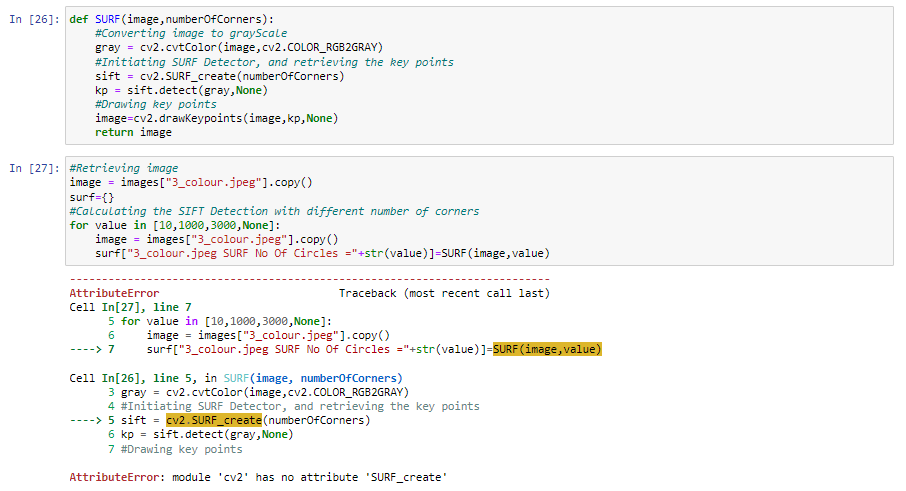

<b style="font-size:18px;">Exercise 1.4 - ORB</b>

Using opencv research how to use cv2.ORB_create() function.  
Download the <a href="https://github.com/dylanseychell/COTSDataset/blob/master/Part%202%20-%20Multiple%20Objects/academic_book_oc/3_colour.jpeg"> colour_3.jpeg</a> from the academic_book_oc found in the COTS dataset. Apply ORB function to extract features from the image. 
<i style="color:red">
You need opencv-contrib installed
Uninstall all previous opencv versions

pip install opencv-python==3.4.2.17 <br>
pip install opencv-contrib-python==3.4.2.17

</i>
<a href="https://docs.opencv.org/3.4/d1/d89/tutorial_py_orb.html
">link</a>


In [16]:
def ORB(image, numberOfCorners):
    #Converting image to grayScale
    gray= cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    #Initiating ORB Detector, and retrieving the key points
    orb = cv2.ORB_create(numberOfCorners)
    kp = orb.detect(gray,None) #receieve all keypoints from image
    #Drawing key points
    image = cv2.drawKeypoints(image, kp, None, color=(0,0,255))
    return image

In [17]:
#Retrieving image
image = images["3_colour.jpeg"].copy()
orb={}
#Calculating the ORB Detection with different number of corners
for value in [10,1000,3000,None]:
    image = images["3_colour.jpeg"].copy()
    orb["3_colour.jpeg ORB No Of Circles ="+str(value)]=ORB(image,value)

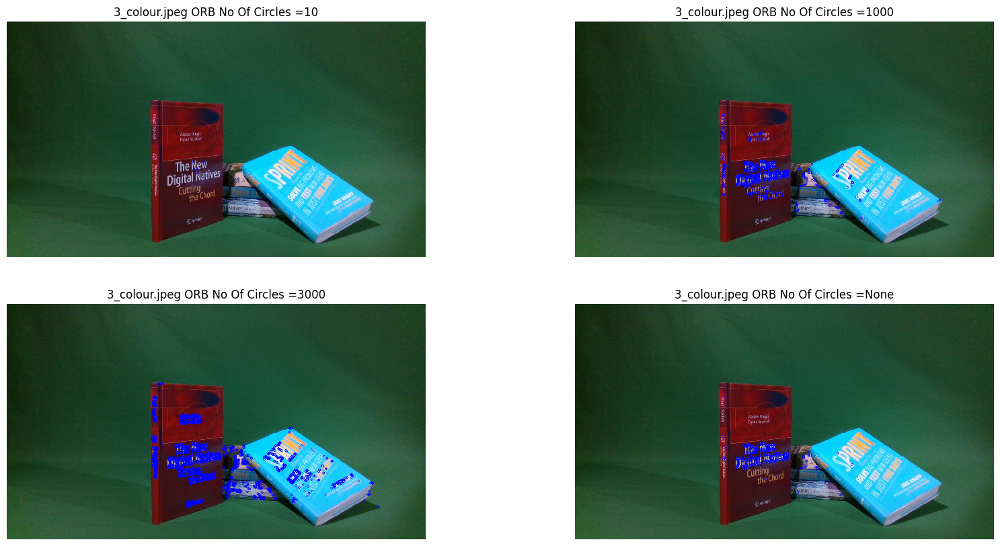

In [18]:
#Displaying Image
PrintImages(orb,2,2)

**Observations:** </br>
The aforementioned images with various corner count values were produced using the ORB function. It was discovered that a corner count of 1000 generated the best corner detection results, but a larger corner count, such as None, discovered a large number of corners, the most of which were false positives. On the other hand, a smaller corner count value than 1000 failed to detect all the corners. We may thus draw the conclusion that the corner count value used has a significant impact on the accuracy of the ORB function's corner detection findings. The corner count would need to be changed for each image in order to produce the desired results, which is a significant downside. Additionally, when comparing the above corner detected images, it was noted that Shi-Tomasi performed better than ORB in this particular case as ORB detected more text rather than the actual book corners. Moreover, SIFT performed better than ORB as SIFT was also able to detect the book's corners, which ORB could not.

<b style="font-size:18px;">Exercise 1.5 - Segmentation</b>

At this point we went through a number of different feature detectors and created the feature points that describe interesting and unique features within the image. <br>
In the next exercise research how to use the following matching method cv2.BFMatcher() to find the matching images.
Create a program that given two images it matches the features between the images (<a href="https://github.com/dylanseychell/COTSDataset/blob/master/Part%202%20-%20Multiple%20Objects/academic_book_oc/2_colour.jpeg">use the colour_2.jpeg as well as the image used from the previous exercises from the same repository in the COTS dataset</a>).<br>
Document the difference between the different detectors to show which one gave you the best accuracy. 

<a href="https://docs.opencv.org/4.x/d3/da1/classcv_1_1BFMatcher.html">link></a>

In [19]:
#Retrieving Images and creating dictionary
segmentedImages={}
image1 = images["3_colour.jpeg"].copy()
image2 = images["2_colour.jpeg"].copy()

In [20]:
def Segmentation(image1,image2,detectorBit,numberofMatches):
    #Converting Images to grayScale
    gray1= cv2.cvtColor(image1,cv2.COLOR_RGB2GRAY)
    gray2= cv2.cvtColor(image2,cv2.COLOR_RGB2GRAY)
    
    if(detectorBit==1):#ORB Detection  
        orb = cv2.ORB_create()
        kp1, des1 = orb.detectAndCompute(gray1,None)
        kp2, des2 = orb.detectAndCompute(gray2,None)
    elif(detectorBit==2):#SIFT Detection  
        sift = cv2.SIFT_create()
        kp1, des1 = sift.detectAndCompute(gray1,None)
        kp2, des2 = sift.detectAndCompute(gray2,None)
    
    #Matching the different descriptors for both images
    bf = cv2.BFMatcher()
    matches = bf.match(des1,des2)
    #Sorting matches by distance
    matches = sorted(matches, key = lambda x:x.distance)

    #Drawing matches
    image = cv2.drawMatches(image1,kp1,image2,kp2,matches[:numberofMatches],None)
    return image

### Applying ORB

In [21]:
orbSegmentation={}
#Calculating the ORB Detection with different number of corners
for value in [10,200,1000,3000]:
    image1 = images["3_colour.jpeg"].copy()
    image2 = images["2_colour.jpeg"].copy()
    orbSegmentation["3_colour.jpeg ORB Segmentation No Of Matches ="+str(value)]=Segmentation(image1,image2,1,value)

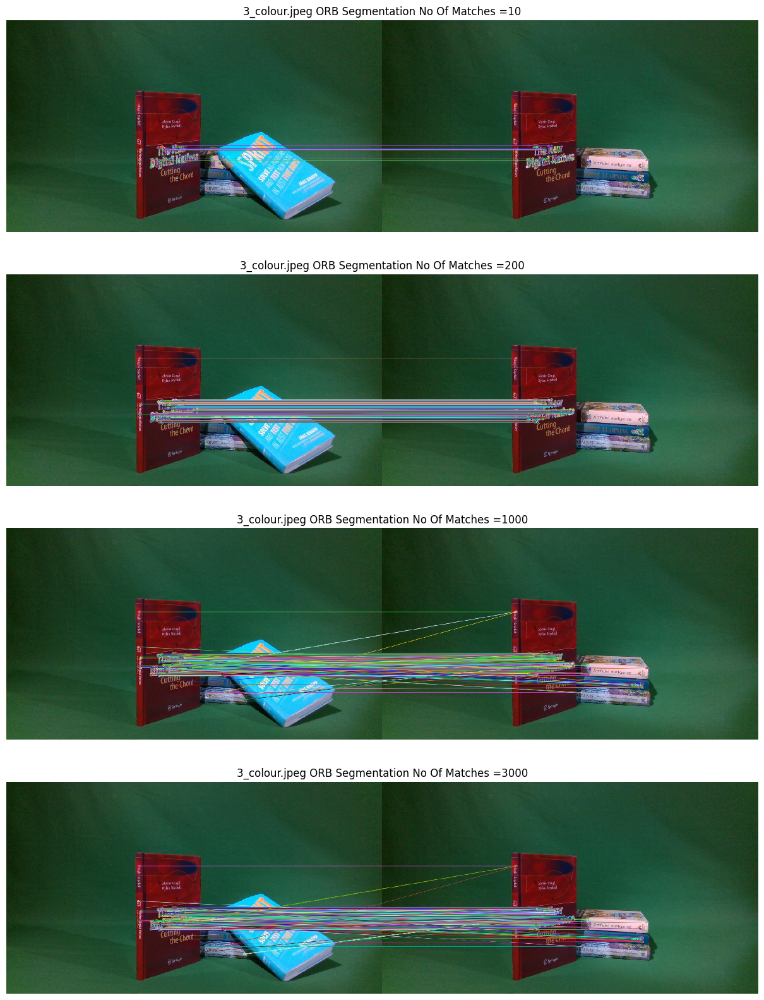

In [22]:
#Displaying Image
PrintImages(orbSegmentation,4,1)

### Applying SIFT

In [23]:
siftSegmentation={}
#Calculating the ORB Detection with different number of corners
for value in [10,200,1000,3000]:
    image1 = images["3_colour.jpeg"].copy()
    image2 = images["2_colour.jpeg"].copy()
    siftSegmentation["3_colour.jpeg SIFT Segmentation No Of Matches ="+str(value)]=Segmentation(image1,image2,2,value)

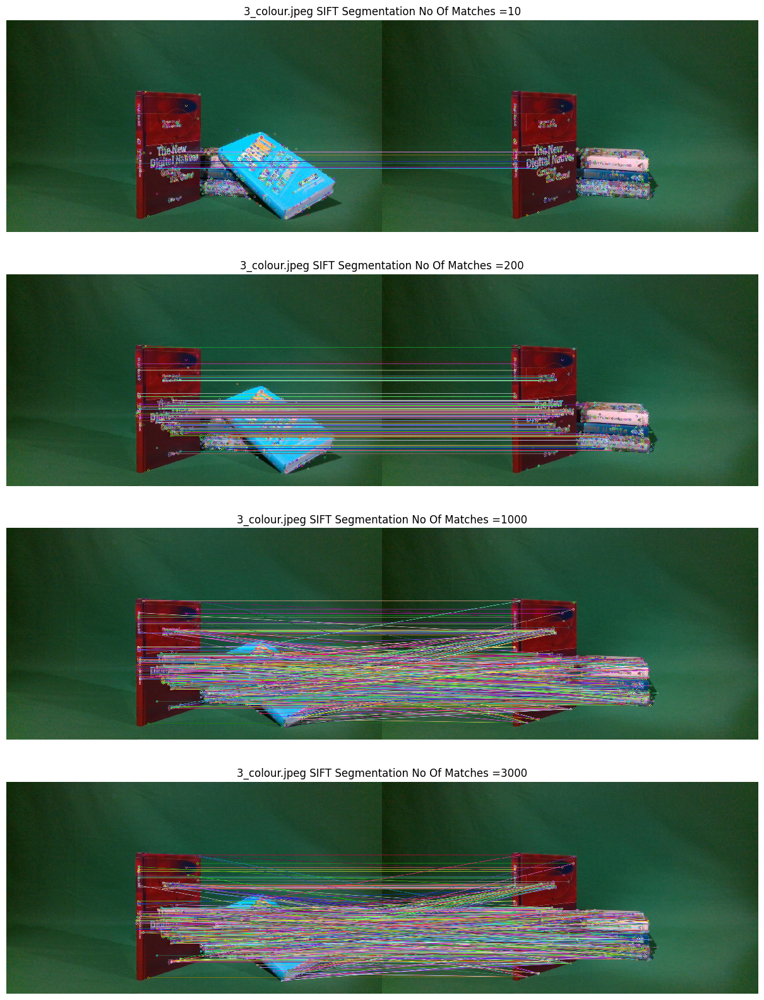

In [24]:
#Displaying Image
PrintImages(siftSegmentation,4,1)

### Displaying the Different Results

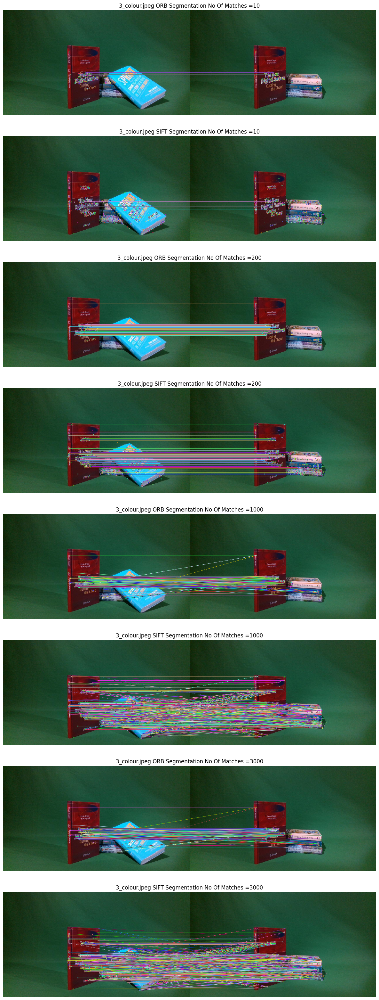

In [25]:
#Storing the above results
for k, v in zip(orbSegmentation.items(), siftSegmentation.items()):
    segmentedImages[k[0]] = k[1]
    segmentedImages[v[0]] = v[1]
PrintImages(segmentedImages,len(segmentedImages),1)

**Observations:** </br>
When comparing the SIFT to ORB Segmented Images, it was discovered that there were more SIFT matches and that the quality of those matches was also better. The corners were more accurately and precisely matched thanks to SIFT's capacity to extract more distinct features from the images. This can be seen in the visual output of the matches, which showed that SIFT's matches appeared to be more coherent and aligned with the actual corners of the book, whereas ORB's matches were more erratic and less precise, the latter focusing on the central area of the book which highlighted the book's text. SURF could not be compared as it did not work.